## Exploratory Data Analysis

In [1]:
#import packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
#import pycaret
!pip install pycaret

In [3]:
#for Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [4]:
#list all dataset from pycaret
from pycaret.datasets import get_data
data = get_data('index')

,Dataset,Data Types,Default Task,Target Variable 1,Target Variable 2,# Instances,# Attributes,Missing Values
0,anomaly,Multivariate,Anomaly Detection,None,None,1000,10,N
1,france,Multivariate,Association Rule Mining,InvoiceNo,Description,8557,8,N
2,germany,Multivariate,Association Rule Mining,InvoiceNo,Description,9495,8,N
3,bank,Multivariate,Classification (Binary),deposit,None,45211,17,N
4,blood,Multivariate,Classification (Binary),Class,None,748,5,N
5,cancer,Multivariate,Classification (Binary),Class,None,683,10,N
6,credit,Multivariate,Classification (Binary),default,None,24000,24,N
7,diabetes,Multivariate,Classification (Binary),Class variable,None,768,9,N
8,electrical_grid,Multivariate,Classification (Binary),stabf,None,10000,14,N
9,employee,Multivariate,Classification (Binary),left,None,14999,10,N


In [5]:
#select for dataset named 'anomaly'
df = get_data('anomaly')

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754


In [6]:
#get statistics
df.describe()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.491362,0.490200,0.509077,0.497362,0.586120,0.514636,0.508270,0.457541,0.477685,0.495760
std,0.259138,0.251931,0.256606,0.263562,0.334658,0.317470,0.278483,0.220129,0.241432,0.211677
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.014495
25%,0.287458,0.291449,0.337802,0.256147,0.169680,0.142587,0.246021,0.245539,0.291452,0.329904
50%,0.492070,0.488656,0.510077,0.497537,0.782019,0.537953,0.465679,0.515619,0.387753,0.488891
75%,0.694192,0.686531,0.686914,0.731949,0.847956,0.856512,0.804935,0.626757,0.723674,0.659528
max,0.994431,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.988732,1.000000


In [7]:
#get info to check for null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Col1    1000 non-null   float64
 1   Col2    1000 non-null   float64
 2   Col3    1000 non-null   float64
 3   Col4    1000 non-null   float64
 4   Col5    1000 non-null   float64
 5   Col6    1000 non-null   float64
 6   Col7    1000 non-null   float64
 7   Col8    1000 non-null   float64
 8   Col9    1000 non-null   float64
 9   Col10   1000 non-null   float64
dtypes: float64(10)
memory usage: 78.2 KB


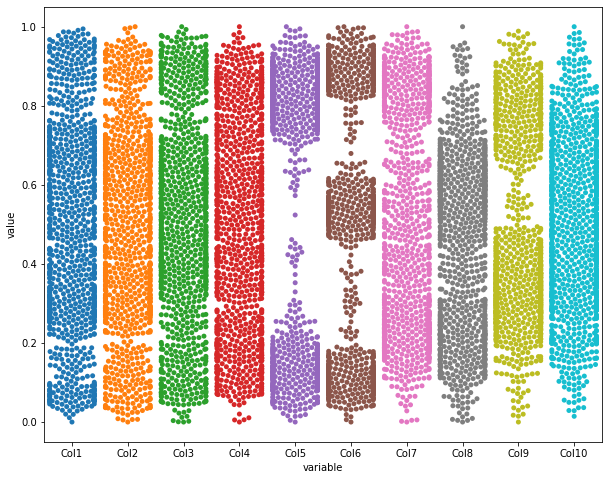

In [8]:
#swarmplot to check for outliers
plt.rcParams['figure.figsize'] = (10, 8)
sns.swarmplot(x='variable',
              y='value',
              data=pd.melt(df))

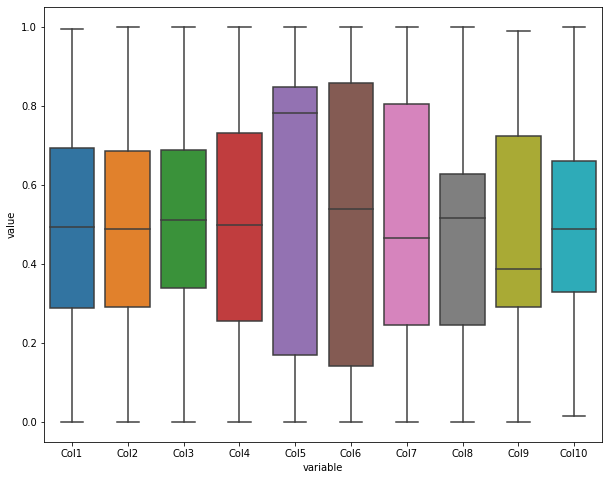

In [9]:
#boxplot
sns.boxplot(x='variable',
              y='value',
              data=pd.melt(df))

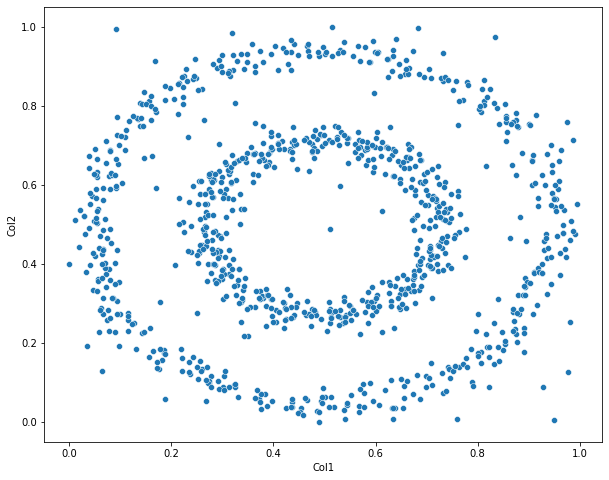

In [10]:
#scatterplot
sns.scatterplot(x='Col1',
              y='Col2',
              data=df)

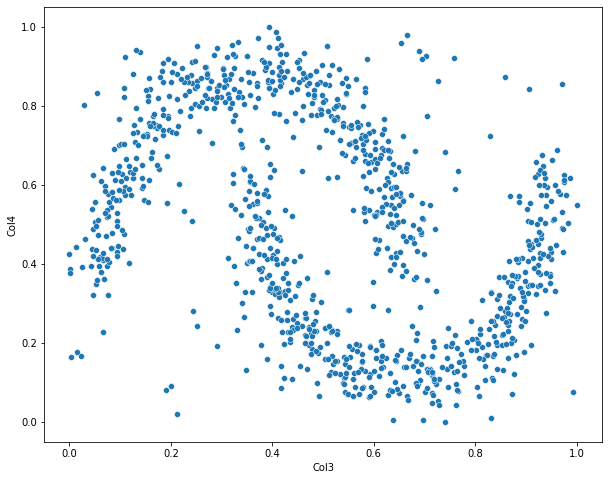

In [11]:
#scatterplot
sns.scatterplot(x='Col3',
              y='Col4',
              data=df)

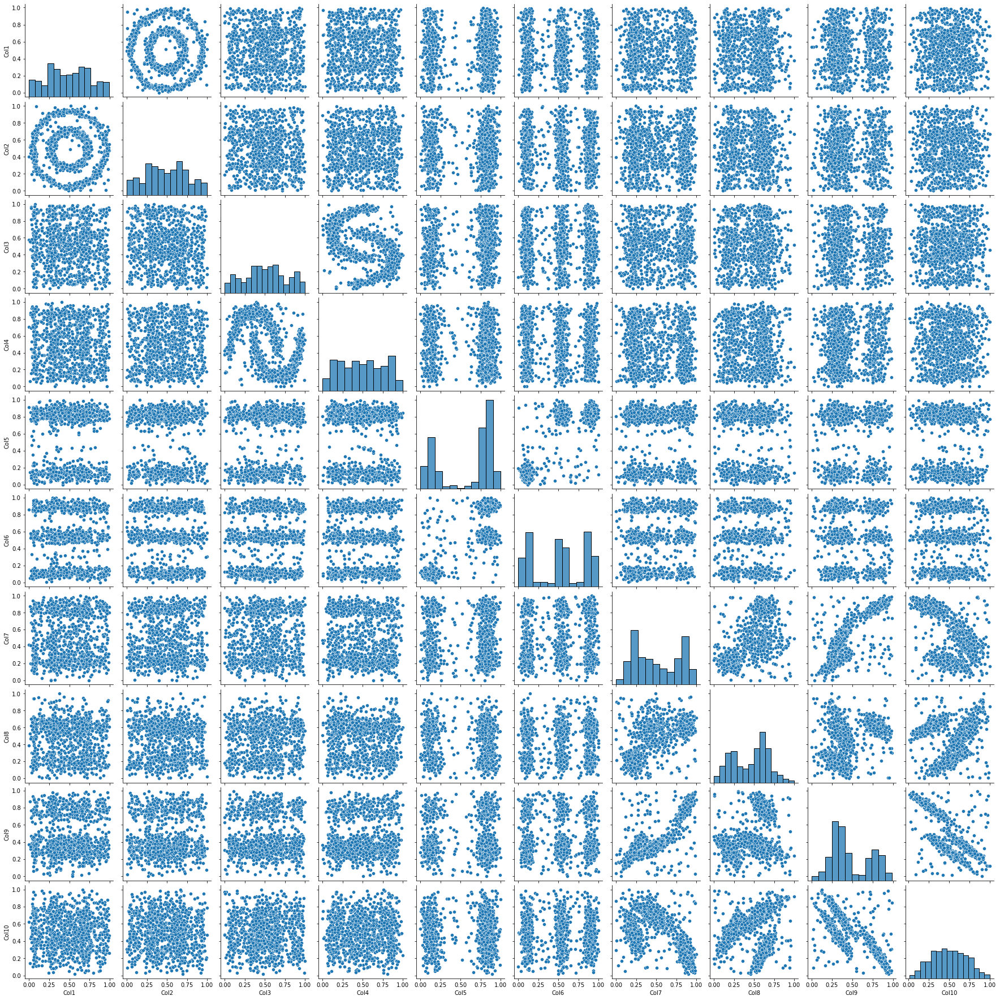

In [12]:
#see all relationships pairwise with pairplot
sns.pairplot(df)

## Set Up PyCaret Environment

In [13]:
#setting up environment
from pycaret.anomaly import *

In [14]:
exp_1 = setup(df, session_id=121, experiment_name='Anomaly1')

,Description,Value
0,session_id,121
1,Original Data,"(1000, 10)"
2,Missing Values,False
3,Numeric Features,10
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(1000, 10)"
9,CPU Jobs,-1


## Select and Create Model

In [15]:
#check for available models
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


## Train Test Split

In [16]:
data = df.sample(frac=0.95, random_state=786).reset_index(drop=True)
data_unseen = df.drop(data.index).reset_index(drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (950, 10)
Unseen Data For Predictions: (50, 10)


## Build Models

### Isolation Forest

In [17]:
#isolation forest model
iforest = create_model('iforest')

In [18]:
#see info
print(iforest)

IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=121, verbose=0)


### Local Outlier Factor

In [19]:
#local outlier factor
lof = create_model('lof')

#see info
print(lof)

LOF(algorithm='auto', contamination=0.05, leaf_size=30, metric='minkowski',
  metric_params=None, n_jobs=-1, n_neighbors=20, novelty=False, p=2)


### K-nearest Neighbors Detector

In [20]:
#knn
knn = create_model('knn')

#info
print(knn)

KNN(algorithm='auto', contamination=0.05, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
  radius=1.0)


## Compare Models

In [21]:
#iforest
iforest_results = assign_model(iforest)
iforest_results.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,-0.029283
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,-0.069976
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,1,0.005709
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,0.050846
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,-0.043415


In [22]:
#lof
lof_results = assign_model(lof)
lof_results.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,1.262565
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,1.043429
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,0,1.331218
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,1.591832
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,1.223609


In [23]:
#knn
knn_results = assign_model(knn)
knn_results.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,0.569672
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,0.484217
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,1,0.691915
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,0.811600
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,0.634337


In [24]:
#filter anomalies
iforest_anomaly = iforest_results[iforest_results['Anomaly']==1]
iforest_anomaly.shape

(50, 12)

In [25]:
#filter anomalies
lof_anomaly = lof_results[lof_results['Anomaly']==1]
lof_anomaly.shape

(50, 12)

In [26]:
#filter anomalies
knn_anomaly = knn_results[knn_results['Anomaly']==1]
knn_anomaly.shape

(50, 12)

## Data Visualization

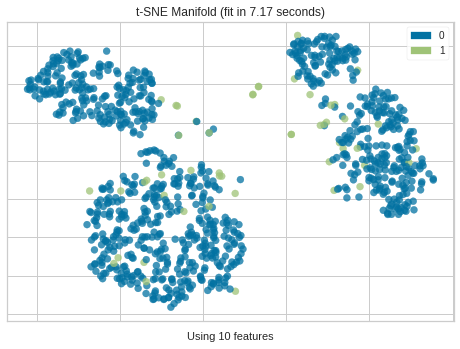

In [27]:
from yellowbrick.features import Manifold

#iforest
df_1 = iforest_results['Anomaly']

#create visualization
vis = Manifold(manifold='tsne')
vis.fit_transform(df, df_1)
vis.show()

In [28]:
#iforest
plot_model(iforest)

In [29]:
#lof
plot_model(lof, plot='umap')

In [30]:
#knn
plot_model(knn)

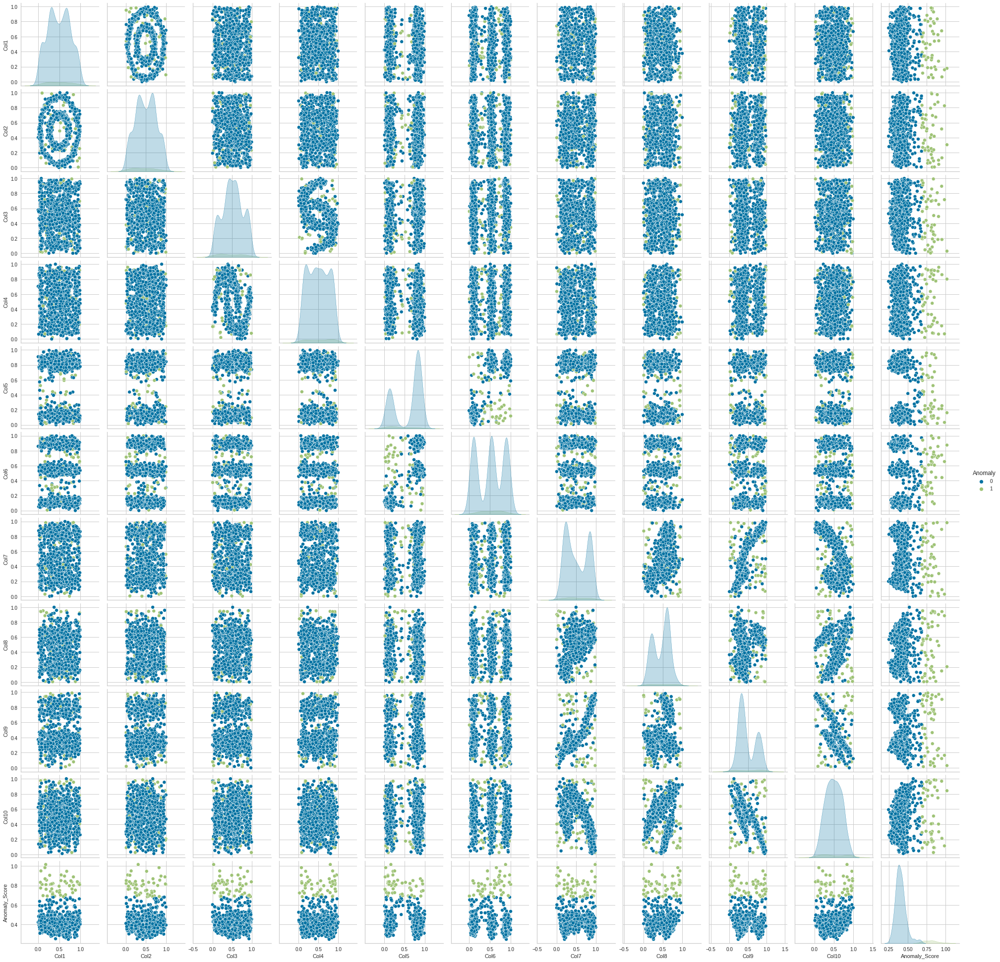

In [31]:
#pairplot
sns.pairplot(knn_results, hue='Anomaly')

In [32]:
#save
save_model(iforest, 'iforest')
save_model(lof, 'lof')
save_model(knn, 'knn')

Transformation Pipeline and Model Successfully Saved
Transformation Pipeline and Model Successfully Saved
Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None...
                 ('fix_perfect', 'passthrough'),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  KNN

## Make Prediction on Unseen Data

In [33]:
#isolation forest
iforest_unseen_predictions = predict_model(iforest, data=data_unseen)
iforest_unseen_predictions.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.125264,0.773856,0.415752,0.850356,0.972256,0.886139,0.876696,0.763149,0.712678,0.459526,0,-0.031965
1,0.279601,0.607907,0.383956,0.910486,0.869457,0.539187,0.642857,0.609837,0.419392,0.637570,0,-0.093066
2,0.952174,0.599417,0.854526,0.221579,0.060714,0.132354,0.153420,0.267362,0.175895,0.658706,0,-0.025727
3,0.233807,0.557205,0.697779,0.166308,0.119722,0.080003,0.184172,0.119957,0.313294,0.421604,0,-0.080165
4,0.437247,0.666046,0.657132,0.507796,0.812932,0.462152,0.629140,0.436982,0.459781,0.550360,0,-0.120745


In [34]:
#local outlier factor
lof_unseen_predictions = predict_model(lof, data=data_unseen)
lof_unseen_predictions.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.125264,0.773856,0.415752,0.850356,0.972256,0.886139,0.876696,0.763149,0.712678,0.459526,0,1.042780
1,0.279601,0.607907,0.383956,0.910486,0.869457,0.539187,0.642857,0.609837,0.419392,0.637570,0,0.998859
2,0.952174,0.599417,0.854526,0.221579,0.060714,0.132354,0.153420,0.267362,0.175895,0.658706,0,1.043438
3,0.233807,0.557205,0.697779,0.166308,0.119722,0.080003,0.184172,0.119957,0.313294,0.421604,0,1.007605
4,0.437247,0.666046,0.657132,0.507796,0.812932,0.462152,0.629140,0.436982,0.459781,0.550360,0,0.989945


In [35]:
#k-nearest neighbors detector
knn_unseen_predictions = predict_model(knn, data=data_unseen)
knn_unseen_predictions.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.125264,0.773856,0.415752,0.850356,0.972256,0.886139,0.876696,0.763149,0.712678,0.459526,0,0.382843
1,0.279601,0.607907,0.383956,0.910486,0.869457,0.539187,0.642857,0.609837,0.419392,0.637570,0,0.340405
2,0.952174,0.599417,0.854526,0.221579,0.060714,0.132354,0.153420,0.267362,0.175895,0.658706,0,0.406382
3,0.233807,0.557205,0.697779,0.166308,0.119722,0.080003,0.184172,0.119957,0.313294,0.421604,0,0.288146
4,0.437247,0.666046,0.657132,0.507796,0.812932,0.462152,0.629140,0.436982,0.459781,0.550360,0,0.382625
